## Import modules

In [1]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

import numpy as np
import numpy.random as random
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import bbknn


import celltypist
from celltypist import models

import sctk
import os
import joblib

In [2]:
import session_info
session_info.show()

In [3]:
sc.settings.verbosity = 1          # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=200, color_map = 'RdPu',)

## Function

In [4]:
#>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# extract rank_genes_groups result 
#>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>

import scanpy as sc
import pandas as pd

def rank_genes_groups_to_df(adata, cell):
    
    dic = adata.uns['rank_genes_groups'] 
    
    df = pd.DataFrame({
        'names' : dic['names'][cell],
        'scores' : dic['scores'][cell],
        'pvals' : dic['pvals'][cell],
        'pvals_adj' : dic['pvals_adj'][cell],
        'logfoldchanges' : dic['logfoldchanges'][cell]
    })
    
    return df

In [5]:
%run /nfs/team205/kk18/function/python/obj2pkl.py

## Read in data

batch_key: Donor + Nuclei_or_Cells + Kit_10X

In [6]:
prefix='Myelo'

In [8]:
adata = sc.read_h5ad(f'/nfs/team205/heart/anndata_objects/8regions/scVI/subsets/{prefix}_post-scVI.h5ad')
adata

AnnData object with n_obs × n_vars = 37439 × 27138
    obs: 'sangerID', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'scrublet_score', 'scrublet_leiden', 'cluster_scrublet_score', 'doublet_pval', 'doublet_bh_pval', 'batch_key', 'leiden_scVI', 'cell_type', 'cell_state_HCAv1', 'cell_state_scNym', 'cell_state_scNym_confidence', '_scvi_batch', '_scvi_labels'
    var: 'gene_name_scRNA-0', 'gene_name_snRNA-1', 'gene_name_multiome-2', 'n_cells'
    uns: '_scvi', 'cell_or_nuclei_colors', 'cell_state_HCAv1_colors', 'cell_state_scNym_colors', 'cell_type_colors', 'donor_colors', 'kit_10x_colors', 'leiden_scVI_colors', 'region_colors'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_continuous', 'latent_gene_encoding'
    layers: 'scvi_normalized'
    obsp: 'connectivities', 'distanc

In [9]:
genename_column='gene_name_multiome-2'

In [10]:
# replace the var_names with gene name, for both adata.var and adata.raw.var
# adata.raw.var['gene_id']=adata.raw.var_names
# adata.raw.var.set_index(genename_column, inplace=True)

adata.var['gene_id']=adata.var_names
adata.var.set_index(genename_column, inplace=True)
adata.var_names=adata.var_names.astype('str')
adata.var_names_make_unique()

# normalise and logtransform
# adata.raw = adata
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

In [11]:
adata.X.data[:10]

array([1.5068445, 3.3707297, 1.5068445, 1.5068445, 1.5068445, 2.082554 ,
       1.5068445, 1.5068445, 2.082554 , 1.5068445], dtype=float32)

## Clustering, UMAP

### See resolutions

In [ ]:
%%time
sc.settings.set_figure_params(dpi=80, facecolor='white', color_map = 'RdPu',)

sc.pp.neighbors(adata, use_rep="X_scVI")
sc.tl.umap(adata, min_dist=0.5, spread=1.0, n_components=3)

resolutions = [0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0]
for res in resolutions:
    print(res)
    sc.tl.leiden(adata, resolution=res, key_added=f'leiden_scVI_{res}')
    sc.pl.umap(adata, color=[f'leiden_scVI_{res}'], size=5, components='all', wspace=0.5)

In [19]:
sc.pp.neighbors(adata, use_rep="X_scVI")
sc.tl.umap(adata, min_dist=0.5, spread=1.0, n_components=3)
sc.tl.leiden(adata, resolution=1, key_added='leiden_scVI')
# over clastering to find clear doublet cluster

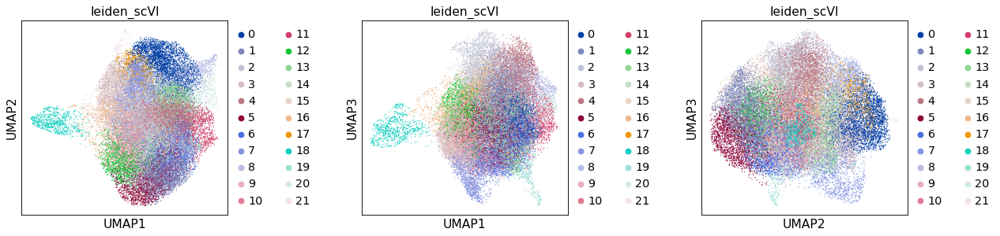

In [20]:
sc.pl.umap(adata, color=['leiden_scVI'], size=5, wspace=0.5, components='all',)

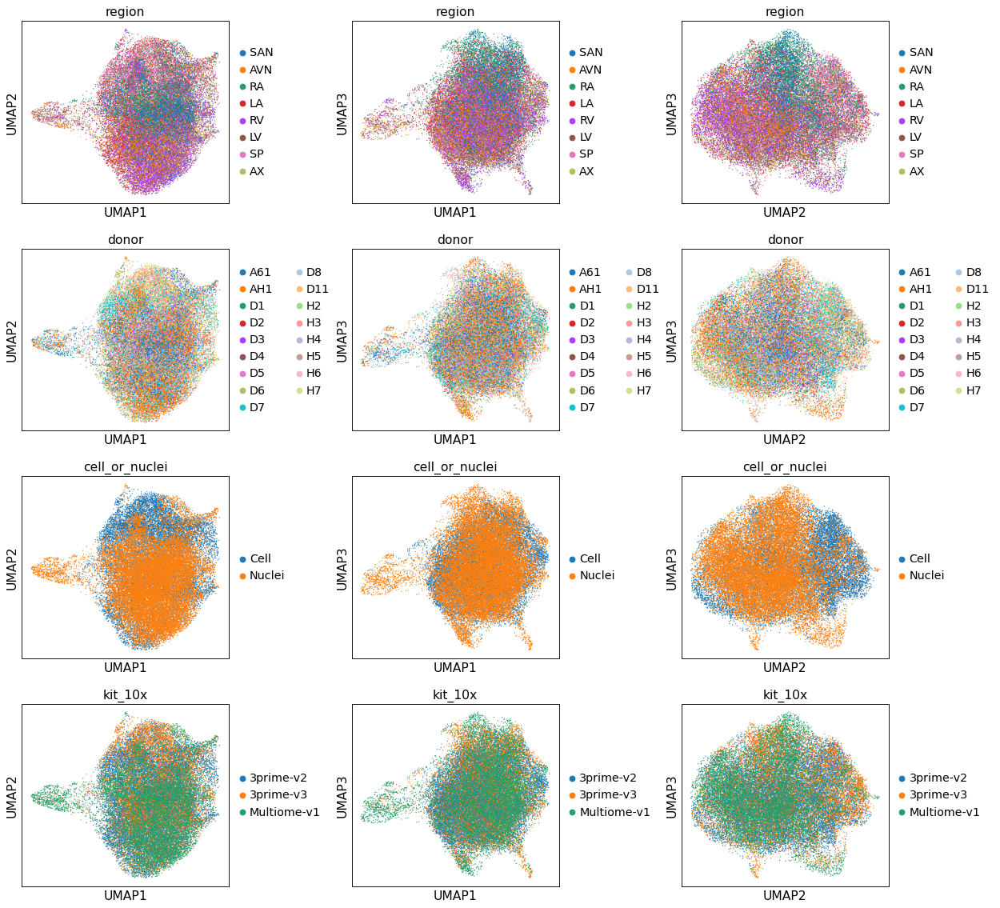

In [23]:
sc.pl.umap(adata, color=['region','donor','cell_or_nuclei','kit_10x'], size=5, wspace=0.45, components='all',ncols=3)

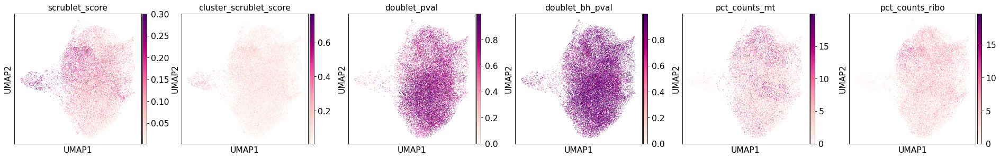

In [24]:
sc.pl.umap(adata, color=['scrublet_score','cluster_scrublet_score','doublet_pval','doublet_bh_pval','pct_counts_mt','pct_counts_ribo'], size=2, wspace=0.2, ncols=6)

In [ ]:
sc.pl.umap(adata, color=['cell_state_HCAv1','cell_state_scNym','cell_state_scNym_confidence'], size=3, wspace=0.2, legend_loc='on data', legend_fontsize=5)

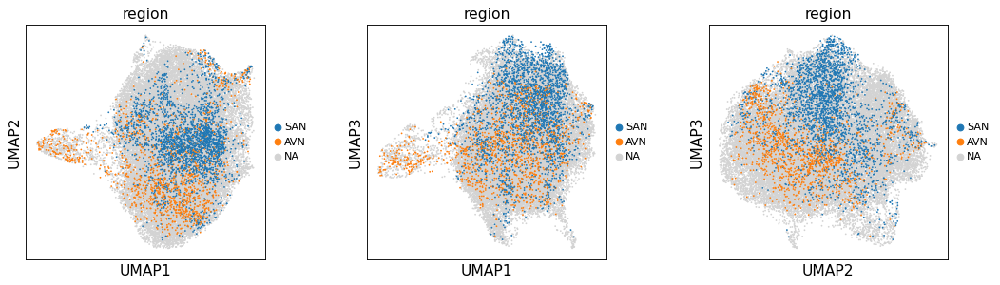

In [29]:
sc.pl.umap(adata, color=['region'], groups=['SAN','AVN'] ,size=10, wspace=0.3, legend_fontsize=10,components='all',ncols=3)

## Find doublet clusters

In [30]:
# proportion of scrublet score > 0.2 per cluster
df=pd.crosstab(adata.obs['scrublet_score']>0.2,adata.obs['leiden_scVI']).T.copy()
df=df.apply(lambda x:x[True]/np.sum(x), axis=1)
df=df.sort_values(ascending=False)
df=pd.DataFrame(df).rename(columns={0:'prop of scrubscore>0.2'})
df

# better to remove cluster 18

,prop of scrubscore>0.2
leiden_scVI,
18,0.598592
3,0.209641
16,0.185430
11,0.110310
7,0.077523
19,0.053571
17,0.030134
10,0.028618
9,0.026867


* Cluster 16 has high scrublet score

         Falling back to preprocessing with `sc.pp.pca` and default params.
categories: 0, 1, 2, etc.
var_group_labels: vCM, aCM, FB, etc.


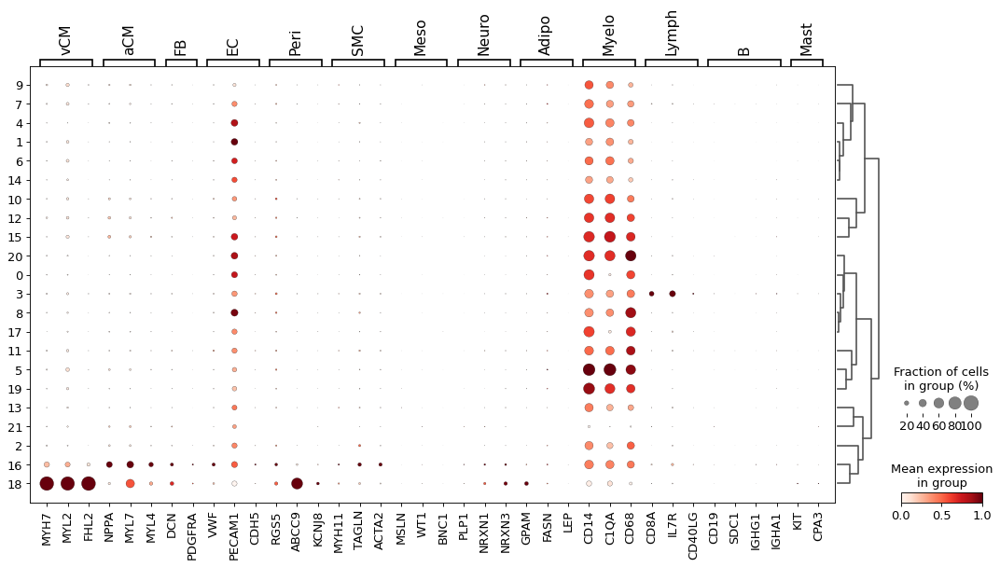

In [31]:
# Checking glabal markers
markers = {
    'vCM': ['MYH7', 'MYL2', 'FHL2'],
    'aCM': ['NPPA', 'MYL7', 'MYL4'],
    'FB': ['DCN', 'GCN', 'PDGFRA'],
    'EC': ['VWF', 'PECAM1', 'CDH5'],
    'Peri': ['RGS5', 'ABCC9', 'KCNJ8'],
    'SMC': ['MYH11', 'TAGLN', 'ACTA2'],
    'Meso': ['MSLN', 'WT1', 'BNC1'],
    'Neuro': ['PLP1', 'NRXN1', 'NRXN3'],
    'Adipo': ['GPAM', 'FASN', 'LEP'],
    'Myelo': ['CD14', 'C1QA', 'CD68'],
    'Lymph': ['CD8A', 'IL7R', 'CD40LG'],
    'B': ['CD19','SDC1','IGHG1','IGHA1'],
    'Mast': ['KIT', 'CPA3'],
}

for key in markers.keys():
    markers[key]=[x for x in markers[key] if x in adata.var_names]

sc.tl.dendrogram(adata, groupby='leiden_scVI')
sc.pl.dotplot(adata,
              markers, 
              groupby='leiden_scVI',
              dendrogram=True,
              standard_scale="var",
              color_map="Reds",
              # swap_axes=True,
             )

* Cluster 18 and 16 are expressing vCM, aCM, and other cell type markers
* Cluster 3 has lymph markers

categories: 0, 1, 2, etc.
var_group_labels: B cell, T cell, naive, etc.


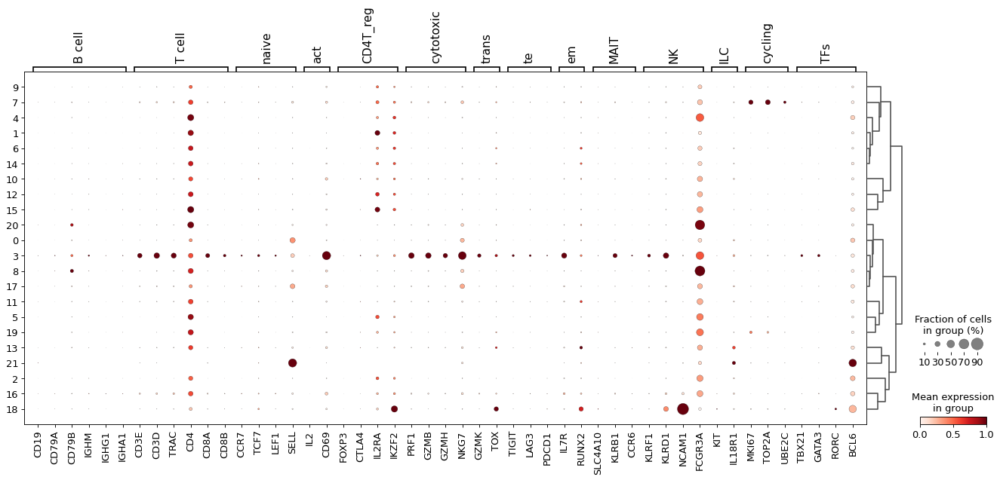

In [32]:
# lymphocytes markers

markers={
    'B cell': ['CD19', 'CD79A', 'CD79B', 'IGHM', 'IGHG1', 'IGHA1'],
    'T cell': ['CD3E', 'CD3D', 'TRAC', 'CD4', 'CD8A', 'CD8B'],
    'naive': ['CCR7', 'TCF7', 'LEF1', 'SELL'],
    'act': ['IL2','CD69'],
    'CD4T_reg': ['FOXP3', 'CTLA4', 'IL2RA', 'IKZF2'],
    'cytotoxic': ['PRF1', 'GZMB', 'GZMH', 'NKG7'],
    'trans': ['GZMK', 'TOX'],
    'te': ['TIGIT', 'LAG3', 'PDCD1'],
    'em': ['IL7R', 'RUNX2'],
    'MAIT': ['SLC4A10', 'KLRB1', 'CCR6'],
    'NK': ['KLRF1', 'KLRD1', 'NCAM1', 'FCGR3A'],
    'ILC': ['KIT', 'IL18R1'],
    'cycling': ['MKI67', 'TOP2A', 'UBE2C'],
    'TFs': ['TBX21', 'GATA3', 'RORC', 'BCL6',],
}


for key in markers.keys():
    markers[key]=[x for x in markers[key] if x in adata.var_names]

sc.pl.dotplot(adata,
              markers, 
              groupby='leiden_scVI',
              dendrogram=True,
              standard_scale="var",
              color_map="Reds",
              # swap_axes=True,
             )

* Cluster 3 has lymph markers, likely doublets

## Annotate doublet clusters, remove, and re-cluster

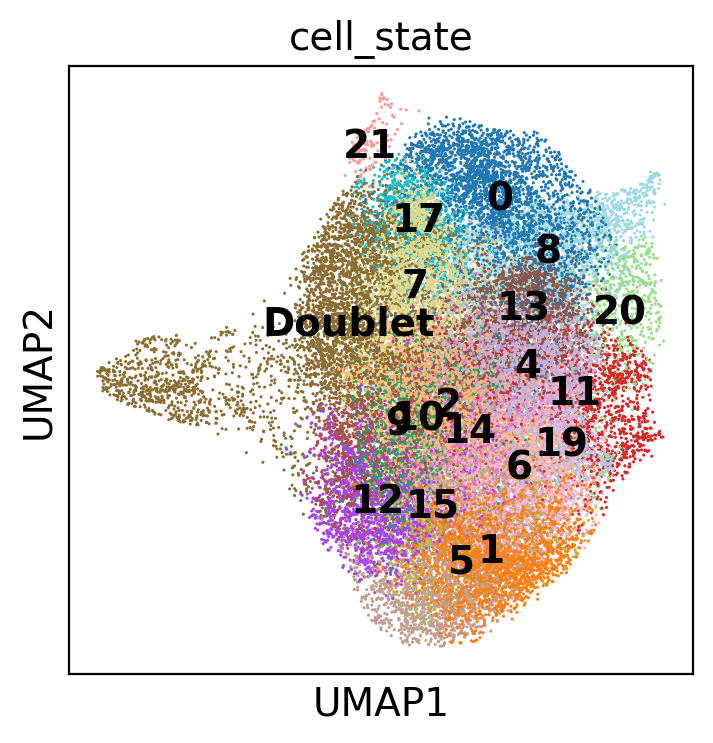

In [127]:
adata.obs['cell_state']=adata.obs['leiden_scVI'].astype('str').copy()
adata.obs.replace({'cell_state':{
   '3':'Doublet',
   '16':'Doublet',
    '18':'Doublet'
}}, inplace=True)

adata.obs['cell_state']=adata.obs['cell_state'].astype('category')

sc.pl.umap(adata, color=['cell_state'], size=5, legend_loc='on data')

In [128]:
# remove doublet clusters and re-clustering
adata_rmdbl = adata[adata.obs['cell_state']!='Doublet']
print(set(adata_rmdbl.obs['cell_state']))

sc.pp.neighbors(adata_rmdbl, use_rep="X_scVI")
sc.tl.umap(adata_rmdbl, min_dist=0.5, spread=1.0, n_components=3)
sc.tl.leiden(adata_rmdbl, resolution=0.75, key_added='leiden_scVI')

{'17', '21', '15', '11', '1', '6', '20', '5', '2', '9', '0', '8', '14', '19', '10', '12', '4', '13', '7'}


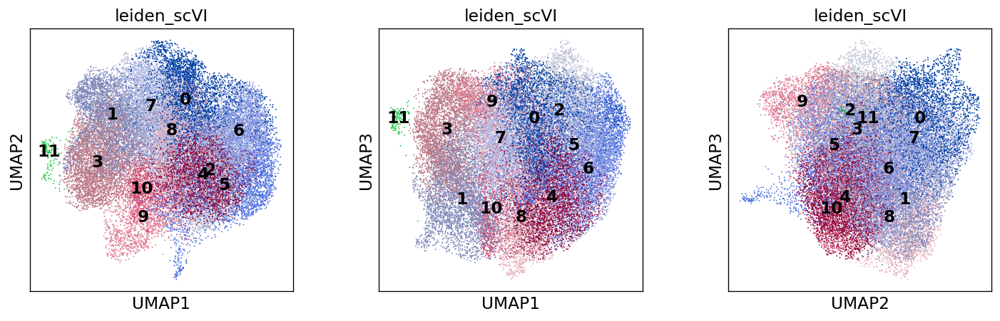

In [129]:
sc.settings.set_figure_params(dpi=120, facecolor='white', color_map = 'RdPu',)
sc.pl.umap(adata_rmdbl, color=['leiden_scVI'], size=5, legend_loc='on data', components='all')

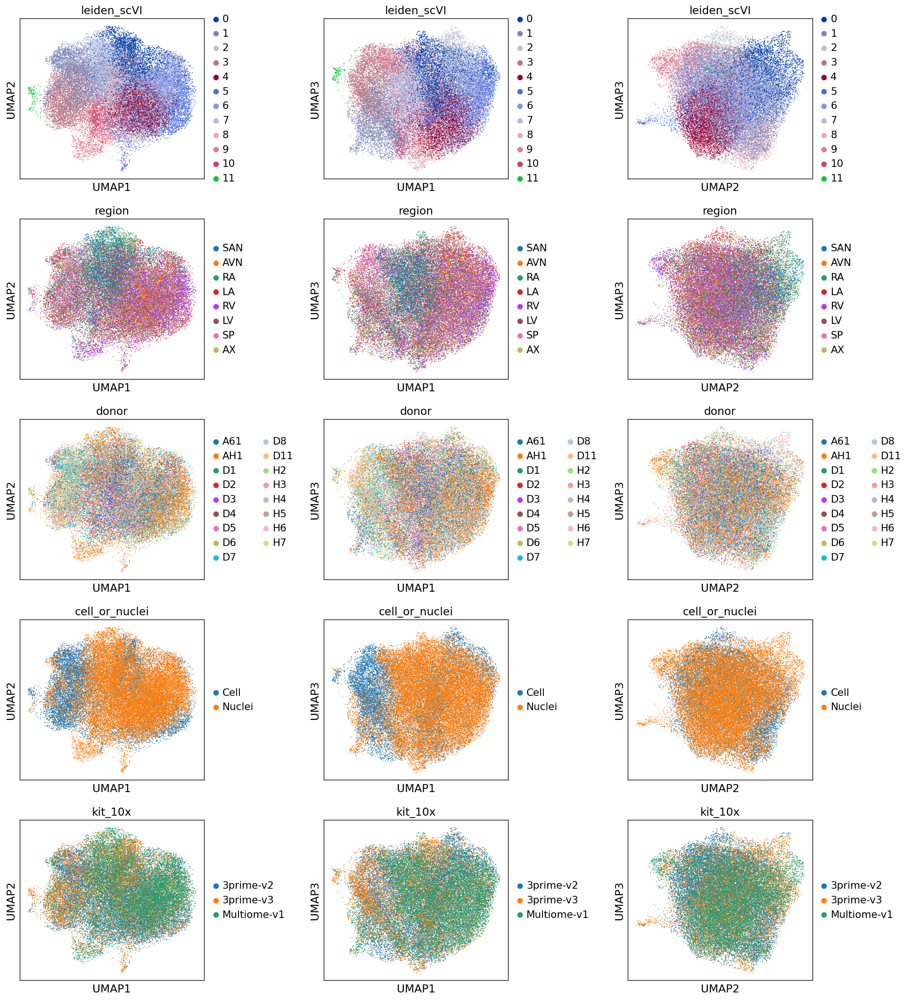

In [132]:
sc.pl.umap(adata_rmdbl, color=['leiden_scVI','region','donor','cell_or_nuclei','kit_10x'], size=5, wspace=0.5, ncols=3, components='all')

In [133]:
# proportion of scrublet score > 0.2 per cluster
df=pd.crosstab(adata_rmdbl.obs['scrublet_score']>0.2,adata_rmdbl.obs['leiden_scVI']).T.copy()
df=df.apply(lambda x:x[True]/np.sum(x), axis=1)
df=df.sort_values(ascending=False)
df=pd.DataFrame(df).rename(columns={0:'prop of scrubscore>0.2'})
df

,prop of scrubscore>0.2
leiden_scVI,
8,0.092277
9,0.073255
10,0.059497
3,0.023843
5,0.021700
1,0.021503
2,0.016203
4,0.015495
0,0.013320


## DEG analysis, marker expressions

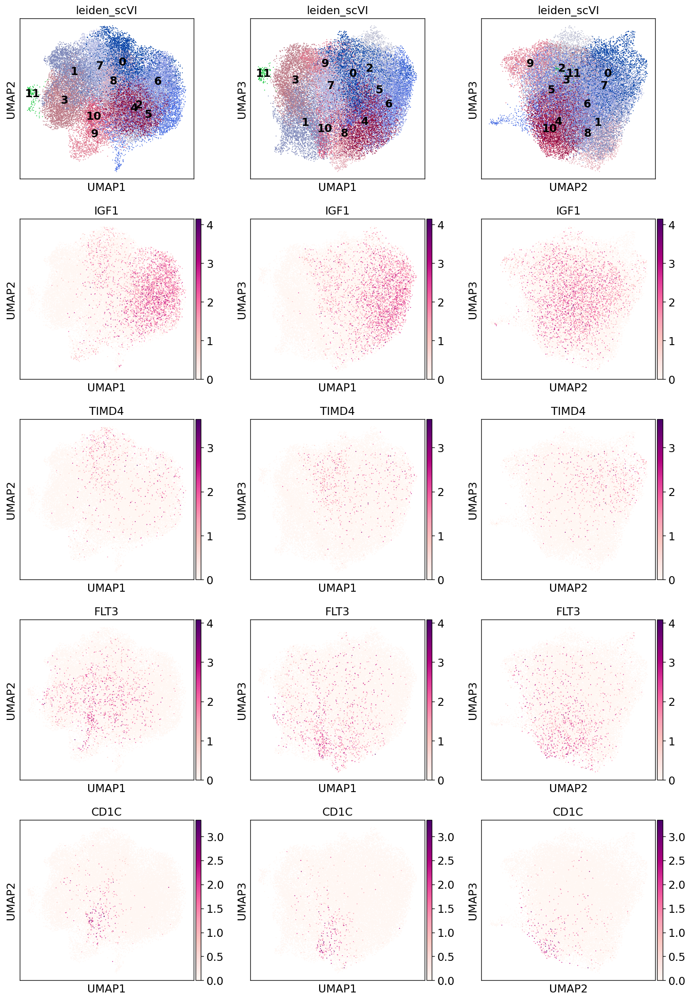

In [134]:
sc.settings.set_figure_params(dpi=120, facecolor='white', color_map = 'RdPu',)
sc.pl.umap(adata_rmdbl, color=['leiden_scVI','IGF1','TIMD4','FLT3','CD1C'], size=5, legend_loc='on data', components='all',ncols=3)

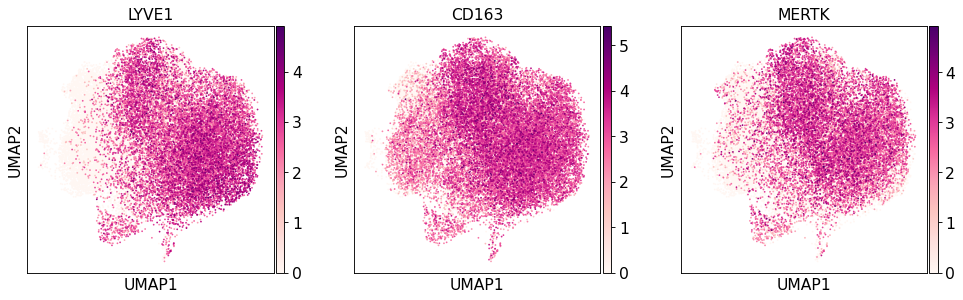

In [41]:
sc.settings.set_figure_params(dpi=80, facecolor='white', color_map = 'RdPu',)
sc.pl.umap(adata_rmdbl, color=['LYVE1','CD163','MERTK'], size=10, use_raw=False)

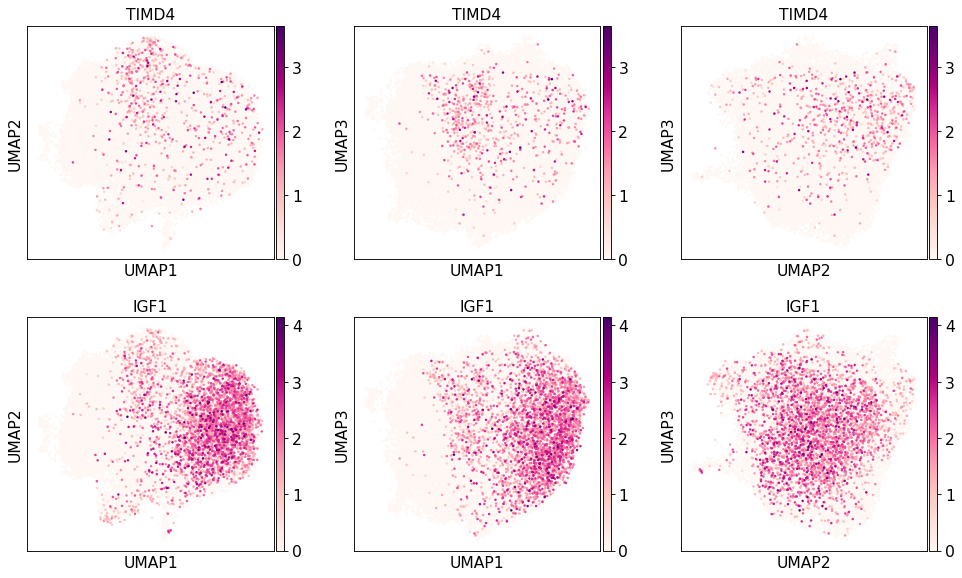

In [65]:
sc.pl.umap(adata_rmdbl, color=['TIMD4','IGF1'], size=20, use_raw=False,components='all',ncols=3)

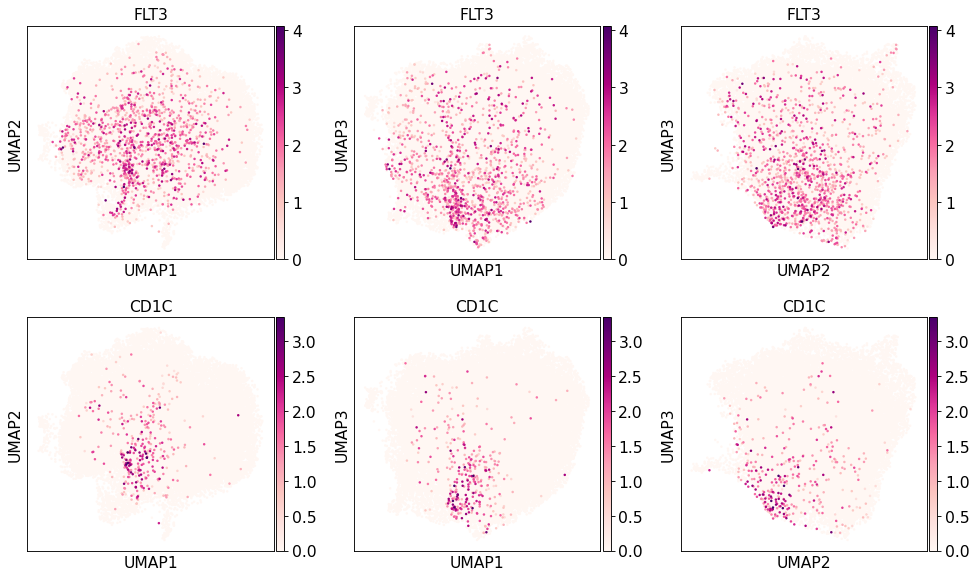

In [78]:
sc.pl.umap(adata_rmdbl, color=['FLT3','CD1C'], size=20, use_raw=False,components='all',ncols=3)

In [ ]:
adata_rmdbl.X.data[:10]

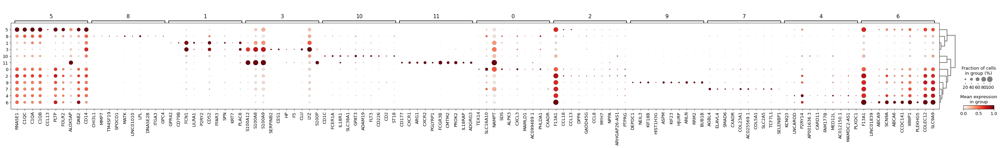

In [112]:
sc.tl.rank_genes_groups(adata_rmdbl, 'leiden_scVI', method='wilcoxon')

DEG_dict = {}
for cluster in adata_rmdbl.obs['leiden_scVI'].cat.categories:
    df=rank_genes_groups_to_df(adata_rmdbl, cluster)
    # select genes: significant and up-regulated ones
    df=df[(df['pvals_adj']<0.05)&(df['logfoldchanges']>0)]
    # sort based on the logFC
    df.sort_values('logfoldchanges',ascending=False,inplace=True)
    DEG_dict[cluster]=list(df[:10]['names'])
    del df

sc.tl.dendrogram(adata_rmdbl, groupby='leiden_scVI')
sc.pl.dotplot(adata_rmdbl,
              DEG_dict, 
              groupby='leiden_scVI',
              dendrogram=True,
              standard_scale="var",
              color_map="Reds",
              swap_axes=False,
             )

In [ ]:
sc.settings.set_figure_params(dpi=80, facecolor='white', color_map = 'RdPu',)

categories: 0, 1, 2, etc.
var_group_labels: Mono, MP, DC, etc.


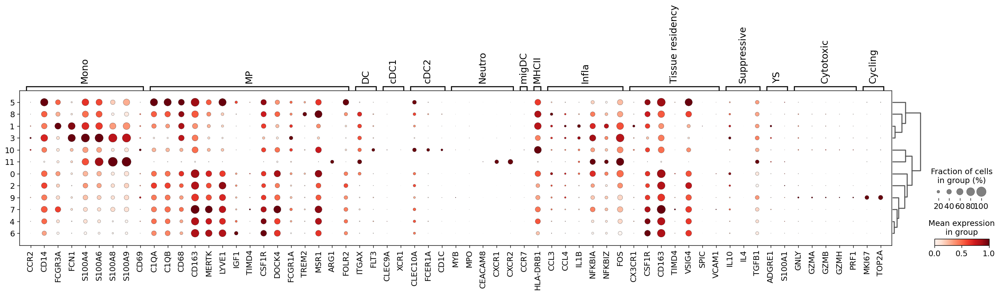

In [135]:
markers={
    'Mono':['CCR2','CD14','FCGR3A','FCN1','S100A4','S100A6','S100A8','S100A9','CD69'],
    'MP':['C1QA','C1QB','CD68','CD163','MERTK','LYVE1','IGF1','TIMD4','CSF1R','DOCK4','FCGR1A','TREM2','MSR1','ARG1','FOLR2'],
    'DC':['ITGAX','FLT3'],
    'cDC1':['CLEC9A','XCR1'],
    'cDC2':['CLEC10A','FCER1A','CD1C'],
    'Neutro':['MYB', 'MPO', 'CEACAM8','CXCR1','CXCR2'],
    'migDC':['CCR7'],
    'MHCII':['HLA-DRB1'],
    'Infla': ['CCL3', 'CCL4', 'IL1B', 'NFKBIA', 'NFKBIZ', 'FOS'],
    'Tissue residency':['CX3CR1','CSF1R','CD163','TIMD4','VSIG4','SPIC','VCAM1'],
    'Suppressive':['IL10','IL4','TGFB1'],
    'YS':['ADGRE1','S100A1'],
     'Cytotoxic':['GNLY','GZMA','GZMB','GZMH','PRF1'],
    'Cycling':['MKI67','TOP2A']
}

sc.tl.dendrogram(adata_rmdbl, groupby='leiden_scVI')
sc.pl.dotplot(adata_rmdbl,
              markers, 
              groupby='leiden_scVI',
              dendrogram=True,
              standard_scale="var",
              color_map="Reds",
              use_raw=False
              # swap_axes=True,
             )

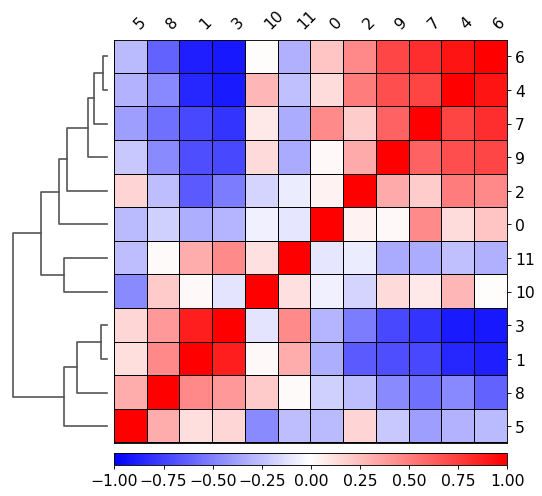

In [136]:
sc.settings.set_figure_params(dpi=80, facecolor='white', color_map = 'RdPu',)
sc.pl.correlation_matrix(adata_rmdbl, 'leiden_scVI', figsize=(8,7))

<AxesSubplot:xlabel='cell_state_HCAv1', ylabel='leiden_scVI'>

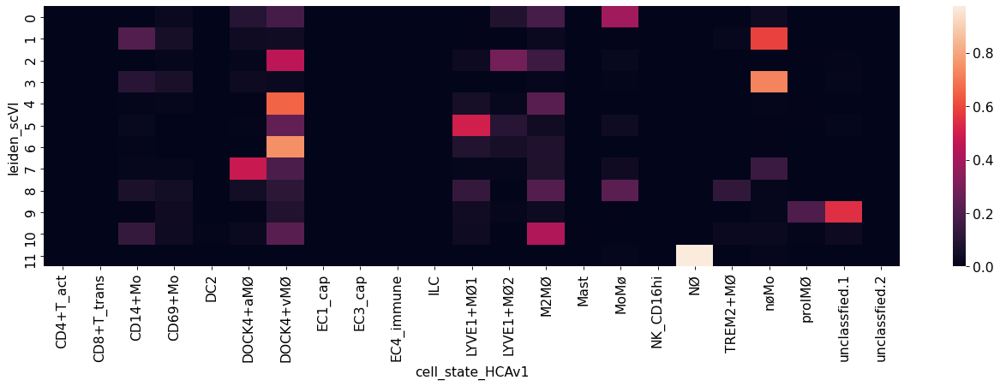

In [137]:
import seaborn as sns

plt.rcParams['figure.figsize'] = 20,5
sns.heatmap(pd.crosstab(adata_rmdbl.obs['leiden_scVI'], adata_rmdbl.obs['cell_state_HCAv1'], normalize='index'))

In [138]:
adata_rmdbl.obs['cell_state']=adata_rmdbl.obs['leiden_scVI'].astype('str').copy()
adata_rmdbl.obs.replace({'cell_state':{
    '0':'LYVE1+TIMD4+MP', # non-classical
    '1':'CD16+Mo', 
    '2':'LYVE1+IGF1+MP', 
    '3':'CD14+Mo', # classical
    '4':'LYVE1+IGF1+MP',  
    '5':'LYVE1+IGF1+MP',  
    '6':'LYVE1+IGF1+MP',  
    '7':'LYVE1+TIMD4+MP', 
    '8':'MoMP',  # TREM2
    '9':'LYVE1+MP_cycling', 
    '10':'DC', 
    '11':'Neut', 
}}, inplace=True)

adata_rmdbl.obs['cell_state']=adata_rmdbl.obs['cell_state'].astype('category')

'''
adata_rmdbl.obs['cell_state'].cat.reorder_categories([
    'CD14+Mo','CD16+Mo','MoMP','LYVE1+IGF1-MP', 'LYVE1+IGF1+MP', 'LYVE1+TIMD4+MP','cDC','Myeloid_cycling', 'Doublet_1','Doublet_2','Doublet_3'
], inplace=True)
'''

adata_rmdbl.obs['cell_state'].value_counts()

LYVE1+IGF1+MP       13729
LYVE1+TIMD4+MP       6972
CD16+Mo              3767
CD14+Mo              3565
MoMP                 2525
LYVE1+MP_cycling     1447
DC                    874
Neut                  117
Name: cell_state, dtype: int64

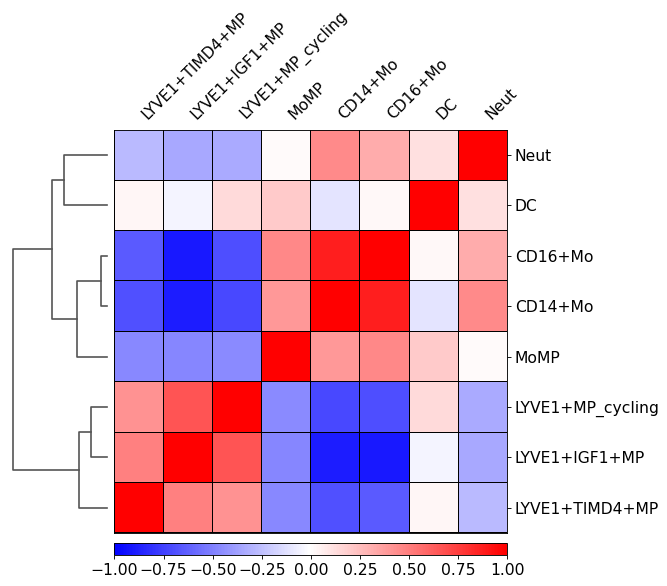

In [139]:
sc.tl.dendrogram(adata_rmdbl, groupby='cell_state')
sc.pl.correlation_matrix(adata_rmdbl, 'cell_state', figsize=(8,7))

categories: CD14+Mo, CD16+Mo, DC, etc.
var_group_labels: Mono, MP, DC, etc.


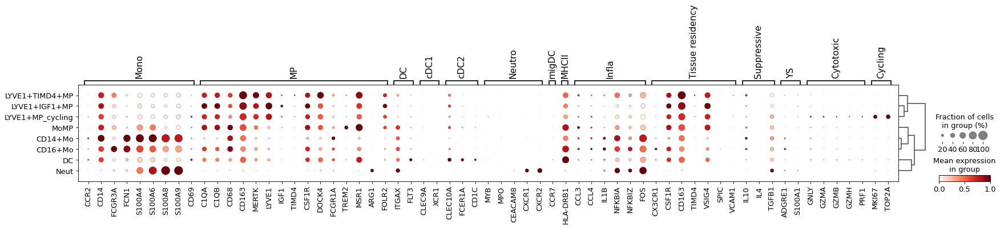

In [140]:
markers={
    'Mono':['CCR2','CD14','FCGR3A','FCN1','S100A4','S100A6','S100A8','S100A9','CD69'],
    'MP':['C1QA','C1QB','CD68','CD163','MERTK','LYVE1','IGF1','TIMD4','CSF1R','DOCK4','FCGR1A','TREM2','MSR1','ARG1','FOLR2'],
    'DC':['ITGAX','FLT3'],
    'cDC1':['CLEC9A','XCR1'],
    'cDC2':['CLEC10A','FCER1A','CD1C'],
    'Neutro':['MYB', 'MPO', 'CEACAM8','CXCR1','CXCR2'],
    'migDC':['CCR7'],
    'MHCII':['HLA-DRB1'],
    'Infla': ['CCL3', 'CCL4', 'IL1B', 'NFKBIA', 'NFKBIZ', 'FOS'],
    'Tissue residency':['CX3CR1','CSF1R','CD163','TIMD4','VSIG4','SPIC','VCAM1'],
    'Suppressive':['IL10','IL4','TGFB1'],
    'YS':['ADGRE1','S100A1'],
     'Cytotoxic':['GNLY','GZMA','GZMB','GZMH','PRF1'],
    'Cycling':['MKI67','TOP2A']
}

sc.pl.dotplot(adata_rmdbl,
              markers, 
              groupby='cell_state',
              dendrogram=True,
              standard_scale="var",
              color_map="Reds",
              use_raw=False
              # swap_axes=True,
             )

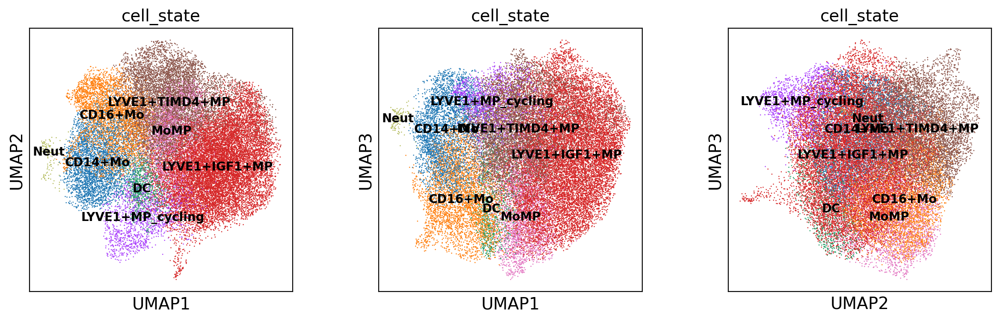

In [145]:
sc.settings.set_figure_params(dpi=200, facecolor='white', color_map = 'RdPu',)
sc.pl.umap(adata_rmdbl, use_raw=False, color=['cell_state'], legend_loc='on data', legend_fontsize=10, components='all')

In [147]:
adata_rmdbl.obs['cell_state'].cat.categories

Index(['CD14+Mo', 'CD16+Mo', 'DC', 'LYVE1+IGF1+MP', 'LYVE1+MP_cycling',
       'LYVE1+TIMD4+MP', 'MoMP', 'Neut'],
      dtype='object')

## Concatenate labels to the original adata and save

In [148]:
adata.obs['cell_state']=adata.obs['cell_state'].astype('str')
adata.obs.loc[adata_rmdbl.obs_names,'cell_state']=adata_rmdbl.obs['cell_state'].astype('str')
adata.obs['cell_state']=pd.Categorical(adata.obs['cell_state'],
                                        categories=['CD14+Mo',
                                                    'CD16+Mo',
                                                   'MoMP',
                                                    'LYVE1+IGF1+MP',
                                                    'LYVE1+TIMD4+MP',
                                                    'LYVE1+MP_cycling',
                                                    'DC',
                                                    'Neut',
                                                    'Doublet'],
                                      ordered=True)
adata.obs['cell_state'].value_counts()

LYVE1+IGF1+MP       13729
LYVE1+TIMD4+MP       6972
Doublet              4443
CD16+Mo              3767
CD14+Mo              3565
MoMP                 2525
LYVE1+MP_cycling     1447
DC                    874
Neut                  117
Name: cell_state, dtype: int64

In [149]:
adata.write(f'/nfs/team205/heart/anndata_objects/8regions/scVI/subsets/{prefix}_post-scVI_cellstates.h5ad')

## Plot marker genes

In [7]:
adata = sc.read_h5ad(f'/nfs/team205/heart/anndata_objects/8regions/scVI/subsets/{prefix}_post-scVI_cellstates.h5ad')
adata

AnnData object with n_obs × n_vars = 37439 × 27138
    obs: 'sangerID', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'scrublet_score', 'scrublet_leiden', 'cluster_scrublet_score', 'doublet_pval', 'doublet_bh_pval', 'batch_key', 'leiden_scVI', 'cell_type', 'cell_state_HCAv1', 'cell_state_scNym', 'cell_state_scNym_confidence', '_scvi_batch', '_scvi_labels', 'leiden_scVI_0.2', 'leiden_scVI_0.3', 'leiden_scVI_0.4', 'leiden_scVI_0.5', 'leiden_scVI_0.6', 'leiden_scVI_0.7', 'leiden_scVI_0.8', 'leiden_scVI_0.9', 'leiden_scVI_1.0', 'cell_state'
    var: 'gene_name_scRNA-0', 'gene_name_snRNA-1', 'n_cells', 'gene_id'
    uns: '_scvi', 'cell_or_nuclei_colors', 'cell_state_HCAv1_colors', 'cell_state_colors', 'cell_state_scNym_colors', 'cell_type_colors', 'dendrogram_leiden_scVI'

In [8]:
adata.X.data[:10]

array([1.5068445, 1.5068445, 1.5068445, 2.082554 , 2.7113698, 1.5068445,
       2.4455945, 1.5068445, 1.5068445, 1.5068445], dtype=float32)

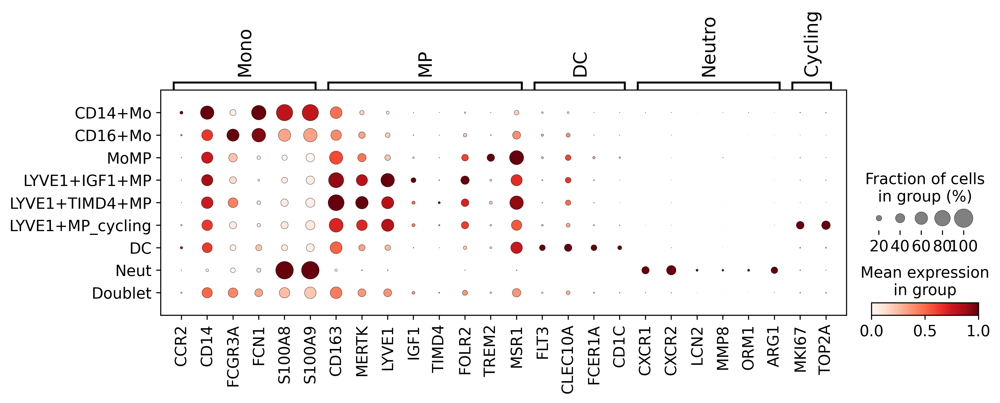

In [21]:
markers={
    'Mono':['CCR2','CD14','FCGR3A','FCN1','S100A8','S100A9'],
    'MP':['CD163','MERTK','LYVE1','IGF1','TIMD4','FOLR2','TREM2','MSR1',],
    'DC':['FLT3','CLEC10A','FCER1A','CD1C'],
    'Neutro':['CXCR1','CXCR2','LCN2','MMP8','ORM1','ARG1'],
    'Cycling':['MKI67','TOP2A']
}

sc.pl.dotplot(adata,
              markers, 
              groupby='cell_state',
              dendrogram=False,
              standard_scale="var",
              color_map="Reds",
              use_raw=False
              # swap_axes=True,
             )